In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
from sklearn.metrics import pairwise_distances

# Input-1-

In [ ]:
video_path = 'DatasetC.mpg'

## (a)..Write a function that performs pixel-by-pixel frame differencing using, as reference frame, the first frame of an image sequence. Apply a classification threshold and save the results to disk.

In [ ]:
def Video_frame_diff_first_image(video_path):

  count = 0
# read the video
  cap = cv2.VideoCapture(video_path)

  # loop the Video-object
  while(cap.isOpened()):
      ret, frame = cap.read()

      if ret:
          # convert it into grayscale
          image = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
          # save the Image
          path = str('Original_Frame_' + str(count) + '.jpg')
          cv2.imwrite(path,image)
          # store the First Frame
          if count == 0:
            frame_1 = image
          # Take the difference first and the next coming frame
          img_diff = cv2.absdiff(image[:,:],frame_1[:,:])
          # threshold the Difference
          img_diff[img_diff > 50] = 255
          img_diff[img_diff <= 50] = 1
          # take the Thresholded Image
          path = str('/content/Threhold_image' + str(count) + '.jpg')
          cv2.imwrite(path,img_diff)
          # show the Difference
          cv2_imshow(img_diff)  
          if cv2.waitKey(1) & 0xFF == ord('q'):
              break
          count +=1 
      else:
          break

  cap.release()
  cv2.destroyAllWindows()

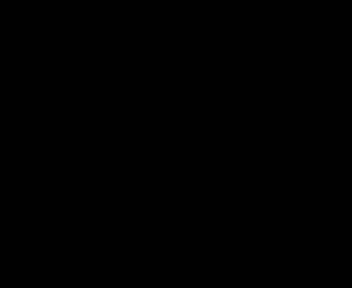

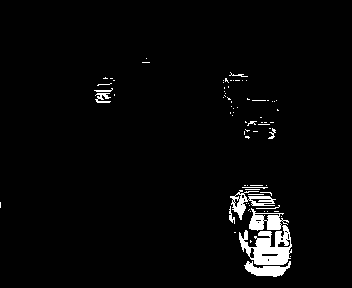

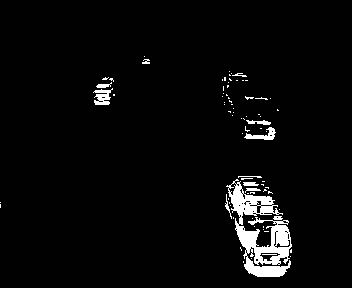

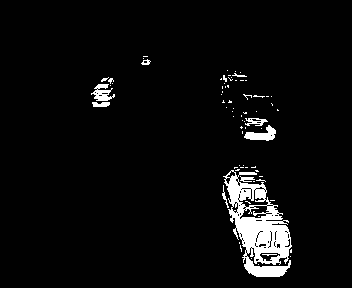

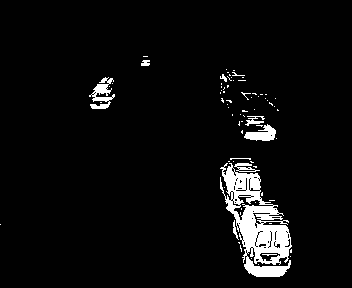

...

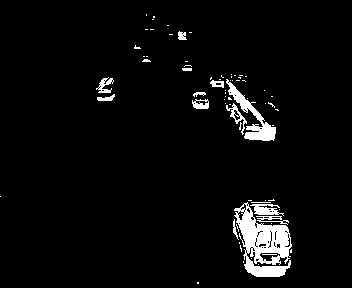

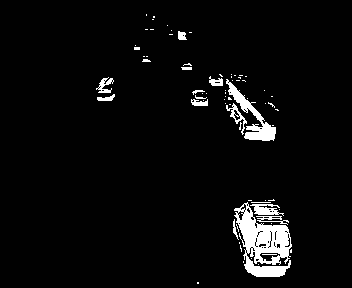

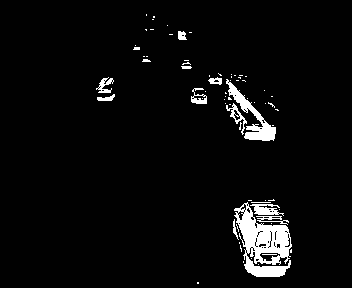

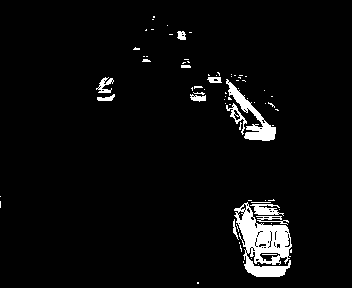

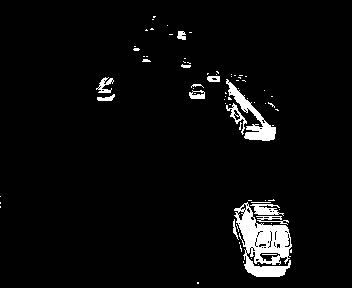

In [ ]:
Video_frame_diff_first_image(video_path)

# Input-2-

In [ ]:
path_reference = 'Original_Frame_0.jpg'
path_frame_1 = 'Original_Frame_1.jpg'
path_frame_100 = 'Original_Frame_100.jpg'

Frame Differene between Frame_0 and Frame_1


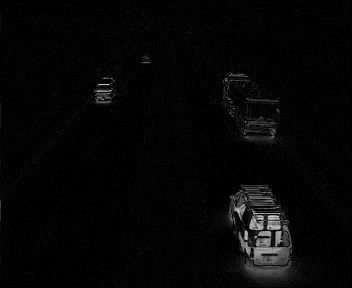

Thresholding the Frame Differene between Frame_0 and Frame_1


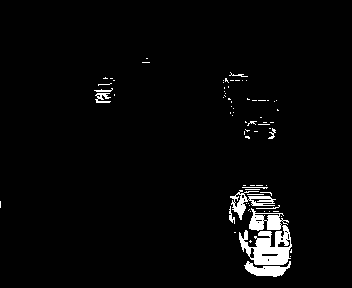

True

In [ ]:
# load the three Images
img_reference  = cv2.imread(path_reference)
img_frame_1 = cv2.imread(path_frame_1)
img_frame_100 = cv2.imread(path_frame_100)

# take the Difference betwen them
img_diff_1 = cv2.absdiff(img_reference[:,:],img_frame_1[:,:])
cv2.imwrite('/content/img_diff_1.jpg',img_diff_1)
print('Frame Differene between Frame_0 and Frame_1')
cv2_imshow(img_diff_1)

# Threshold The Image
img_diff_1[img_diff_1 > 50] = 255
img_diff_1[img_diff_1 <= 50] = 1
print('Thresholding the Frame Differene between Frame_0 and Frame_1')
cv2_imshow(img_diff_1)
cv2.imwrite('/content/img_diff_1_clip.jpg',img_diff_1)

Frame Differene between Frame_0 and Frame_100


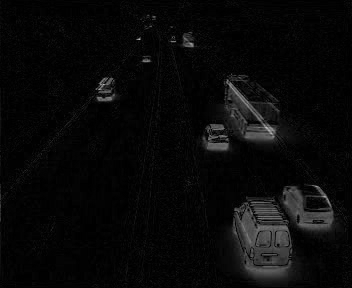

Thresholding Frame Differene between Frame_0 and Frame_100


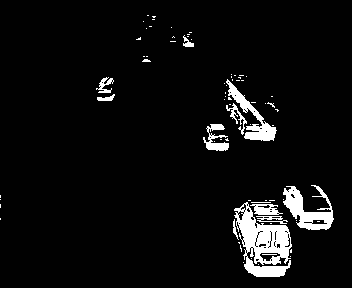

True

In [ ]:
img_diff_100 = cv2.absdiff(img_reference[:,:],img_frame_100[:,:])
cv2.imwrite('/content/img_diff_100.jpg',img_diff_100)
print('Frame Differene between Frame_0 and Frame_100')
cv2_imshow(img_diff_100)
img_diff_100[img_diff_100 > 50] = 255
img_diff_100[img_diff_100 <= 50] = 1
print('Thresholding Frame Differene between Frame_0 and Frame_100')
cv2_imshow(img_diff_100)
cv2.imwrite('/content/img_diff_100_clip.jpg',img_diff_100)

# Question-b

## Repeat the exercise using the previous frame as reference frame (use frame It-1 as reference frame for frame It, for each t). Comment the results in the report.

In [ ]:
def video_path_consecutive_frame_diff(video_path):
  count = 0
# read the video
  cap = cv2.VideoCapture('/content/DatasetC.mpg')

  while(cap.isOpened()):
      ret, frame = cap.read()

      if ret:
        # convert it into grayscale
          image = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
          if count>=1:
            # take th difference between the Previous Frame and Current Frame
            img_diff = cv2.absdiff(image,previous_image)
            # Threshold The Image
            img_diff[img_diff > 40] = 255
            img_diff[img_diff <= 40] = 1
            #  take the Thresholded Image and save it
            path = str('/content/Threhold_image_previous' + str(count) + '.jpg')
            cv2_imshow(img_diff)



          if cv2.waitKey(1) & 0xFF == ord('q'):
              break
          count +=1
          previous_image = image    
      else:
          break

  cap.release()
  cv2.destroyAllWindows()

### Run the below to extarct frame difference of previous Frame and Current Frame

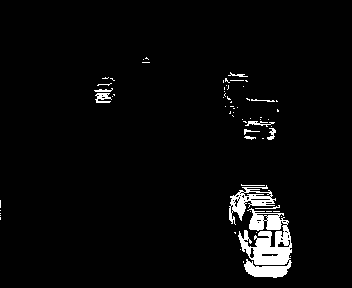

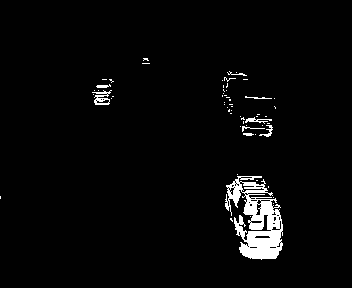

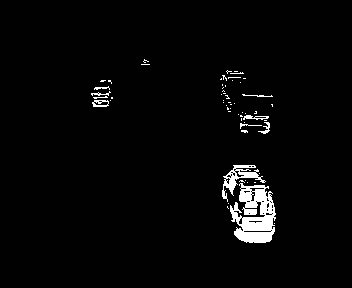

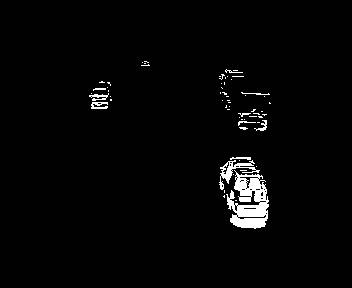

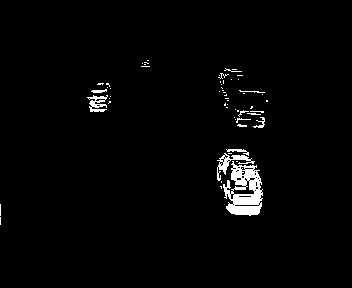

...

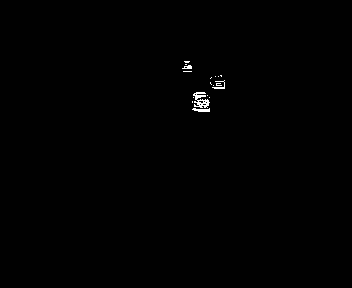

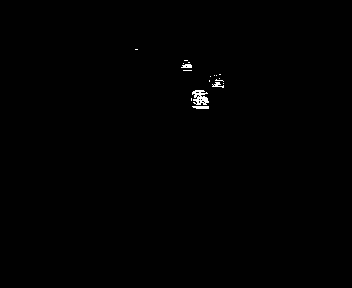

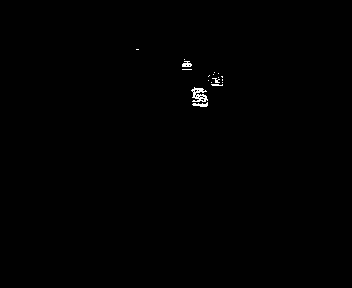

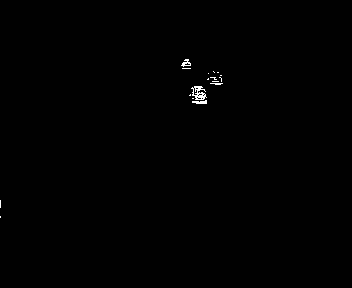

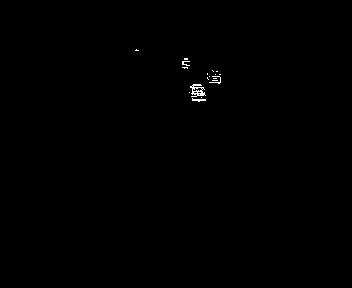

In [ ]:
video_path_consecutive_frame_diff(video_path)

In [ ]:
path_frame_20 = '/content/Original_Frame_20.jpg'
path_frame_21 = '/content/Original_Frame_21.jpg'

Frame Difference between Frame 21 and Frame 20


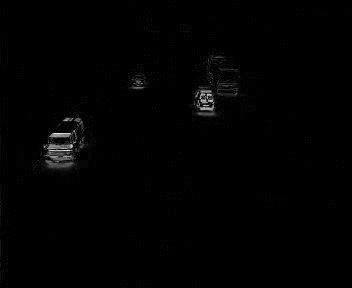

Thresholding the Frame Difference between Frame 21 and Frame 20


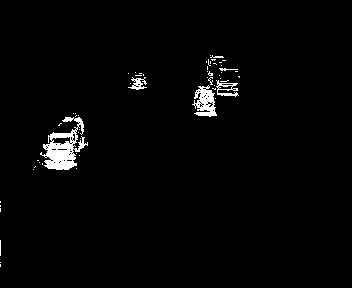

True

In [ ]:
# Load the Images
img_frame_20  = cv2.imread(path_frame_20)
img_frame_21 = cv2.imread(path_frame_21)
# Take the Difference iof the Images
img_diff_21_20 = cv2.absdiff(img_frame_21[:,:],img_frame_20[:,:])
cv2.imwrite('/content/img_diff_1.jpg',img_diff_21_20)
print('Frame Difference between Frame 21 and Frame 20')
cv2_imshow(img_diff_21_20)
# Threshold The Images
img_diff_21_20[img_diff_21_20 > 20] = 255
img_diff_21_20[img_diff_21_20 <= 20] = 1
print('Thresholding the Frame Difference between Frame 21 and Frame 20')
cv2_imshow(img_diff_21_20)
cv2.imwrite('/content/new_diff.jpg',img_diff_21_20)

In [ ]:
path_120 = '/content/Original_Frame_120.jpg'
path_121 = '/content/Original_Frame_121.jpg'

Frame Difference between Frame 120 and Frame 121


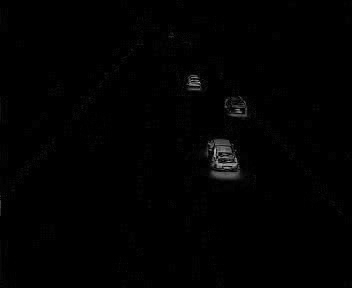

Thresholding the Frame Difference between Frame 120 and Frame 121


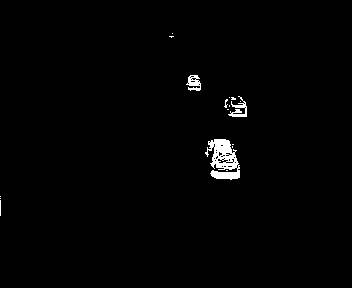

True

In [ ]:
img_frame_20  = cv2.imread(path_120)
img_frame_21 = cv2.imread(path_121)
img_diff_21_20 = cv2.absdiff(img_frame_21[:,:],img_frame_20[:,:])
cv2.imwrite('/content/img_diff_1.jpg',img_diff_21_20)
print('Frame Difference between Frame 120 and Frame 121')
cv2_imshow(img_diff_21_20)
img_diff_21_20[img_diff_21_20 > 30] = 255
img_diff_21_20[img_diff_21_20 <= 30] = 1
print('Thresholding the Frame Difference between Frame 120 and Frame 121')
cv2_imshow(img_diff_21_20)
cv2.imwrite('/content/new_diff_1.jpg',img_diff_21_20)

## Write a function that generates a reference frame (background) for the sequence using for example frame differencing and a weighted temporal averaging algorithm.

## Function to extract the BackGround 

In [ ]:
def ICV_background(video_path):
  count = 0
# read the video
  cap = cv2.VideoCapture(video_path)
  # create a EMPTY array to store the VIDEO and all its frame in 3-D array
  output_video_vector=np.array([])
  # frame Number to index video array
  frame_no= 0
  while(cap.isOpened()):

    ret, frame = cap.read()

    if ret:
        # convert it into grayscale
        frame_no +=1
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        # Taket the First Array and store it as the first face of a 3-D array 
        if frame_no ==1:
          output_video_vector = image
          continue
         # then stack the other Frames along the Z-axis of the Video_Vector 
        output_video_vector = np.dstack((output_video_vector,image))
        
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
         
    else:
        break

  cap.release()
  cv2.destroyAllWindows()

  # TEMPORAL WEIGHTED AVERAGE
  # Now create a Background Image with same size as each Frame
  background_image = np.zeros((output_video_vector.shape[0],output_video_vector.shape[1]))
  factor = []
  # weighted Factor - How much importance to give to each pixel in a Frame
  g= 0.99
  # Loop around the Frame to calcukate the weighted Average 
  for i in range(140):
    factor.append(g**i)
  from tqdm import tqdm
  # i_1 + g* i_2 + (g**2)*i_3 + (g**3)*i_4 + (g**4)*i_5 + ------ so on
  # take all pixels in the all the Frame of the VIDEO at a particular position
  # It will be a vector and says how is this pixel changing over time through each frame
  for i in tqdm(range(output_video_vector.shape[0])):
    for j in range(output_video_vector.shape[1]):
      # Take the weighted Average of the Pixel's across the Vector
      background_image[i,j] = int(np.average(output_video_vector[i,j], weights=factor))
  cv2_imshow(background_image)
  cv2.imwrite('background_image.jpg',background_image)

100%|██████████| 288/288 [00:04<00:00, 68.33it/s]


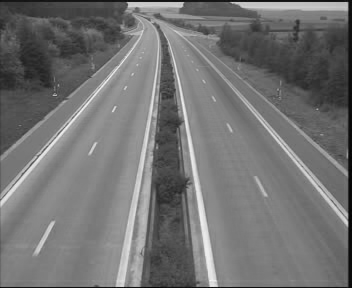

In [ ]:
ICV_background(video_path)

## Write a function that counts the number of moving objects in each frame of a sequence. Generate a bar plot that visualizes the number of objects for each frame of the whole sequence. Discuss in the report the implemented solution, including advantages and disadvantages. How could the disadvantages be overcome?

## Function to count the number of objects in a Given Frame

In [ ]:
def ICV_Count_Objects(video_path):
# read the Frame
  given_frame  = cv2.imread(video_path,0)
# read the Background Frame
  background_image = cv2.imread('background_image.jpg',0)
  # take the frame differencing between the framesd
  frame_difference = cv2.absdiff(background_image[:,:],given_frame[:,:])
  
  cv2.imwrite('img_diff_1.jpg',frame_difference)

  # FIND THE THRESHOLD

  frame_difference[frame_difference > 100] = 255
  frame_difference[frame_difference <= 100] = 1

  # np.array(np.unique(img_diff_21_20, return_counts=True)).T

  #cv2_imshow(frame_difference)

  img_1 = frame_difference[:,:]
  # store the (x,y) of all the points which has pixel value =255
  indices_max = np.where(img_1 == 255)
  # store the x-cordinate of pixel's
  list_x = list(indices_max[0])
  # store the y-cordinates of pixel
  list_y = list(indices_max[1])

  # store the pixels locations in a Dataframe
  df = pd.DataFrame()

  df['x']=list_x
  df['y'] = list_y
  # convert to array
  df_array  = np.array(df)
  df_array = df_array.astype('int32')

  # DBSCAN ALGORITHM
  # calculate the Distance between each point each all other points
  X_distances = pairwise_distances(df_array)
  # sort the points based on the Distance
  X_distances.sort()

 
  # Store the distance's and use the elbow Method to find the Threhold-Minimum Distance
  distances_list = []
  for i in range(X_distances.shape[0]):
    distances_eps=X_distances[i][:150]
    distances_list = distances_list + list(distances_eps)
  distances_list = sorted(distances_list)

  
  #         '''IF needed plot the Graph to Find the Perfect Epsilon'''

  #distances_list = distances_list[:2000]
  #fig = plt.figure()
  #ax = fig.add_axes([0,0,1,1])
  #n = range(len(distances_list))
  #ax.plot(distances_list,n, label='inertia')
  #ax.legend()
  #plt.xlabel("Distance From 10 points")
  #plt.ylabel("No.of.Points from 10")
  #plt.title("Distance from 10 points (vs) No.of.points")
  #plt.show()

   # Now calculate the Minimum distance between two points which is a hyperparameter
  # It says Consider these points for Clustering if they above this distance
  # Epsilon = Minimum Distance
  # Loop the distance list to find the Perfect Epsilon

  for i in range(1,len(distances_list)):
    # take the Index or distance where the distance is constant according to Elbow Method
    if (distances_list[i+1] - distances_list[i]) > (distances_list[i+2] - distances_list[i+1])+1:
      x = i-2
      break
    # The Minimum Distance between objects should not be less than  4.2
    # if the Minimum Distance is Greater than 13 then Consider the Minimum Distance =20   
  if distances_list[x] < 4.2 and  distances_list[x] < 13:
    eps_threshold = 4.123

  elif distances_list[x] < 13 and distances_list[x] > 4.2:
    eps_threshold = distances_list[x]

  else:
    eps_threshold = 20
  # print the Threshold whcih is epsilon says the minimum distance between two objects in the video 
  print(eps_threshold,distances_list[x])
  # RUN a DBSCAN Model using a Epsilon Value
  model_dbscan = DBSCAN(eps=eps_threshold-1, min_samples=3)
  # Fit the Extracted Positons of the array
  model_dbscan.fit(df_array)
  # This gives output saying which Cluster each point belong to
  labels = model_dbscan.labels_
  #  Check the Labels which says How many Objects are present in the Frame
  list_labels = list(set(labels)) 
  # take the x and y cordinate of the one point in each Cluster
  x_cordinates = []
  y_cordinates = []
  # Now use the one point for in each Cluster for showing in the Image
  # Check where the object is present in the Image
  for i in range(len(list_labels)):
    # check for  one point in the one Cluster
    x = np.where(labels==list_labels[i])[0][0]
    # append the x-cordinate of the point in the CLuster
    x_cordinates.append(df_array[x][1])
    # append the y-cordinate of the point in the Cluster
    y_cordinates.append(df_array[x][0])
  # read the Image
  im = plt.imread(video_path)
  # plot the Image as background and use the Cluster points in the Image to scatter and point objects
  implot = plt.imshow(im)
  plt.scatter(x_cordinates,y_cordinates, c='r')
  plt.show()

  return len(list_labels)

20 62.48199740725323


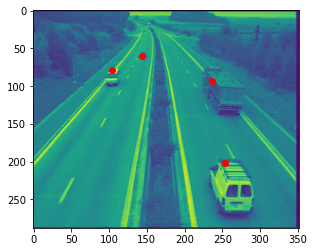

4

In [ ]:
ICV_Count_Objects('Original_Frame_0.jpg')

20 36.05551275463989


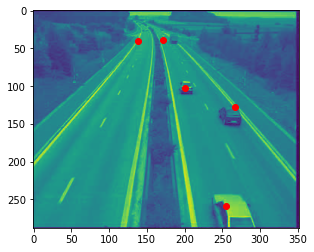

5

In [ ]:
ICV_Count_Objects('Original_Frame_110.jpg')

9.899494936611665 9.899494936611665


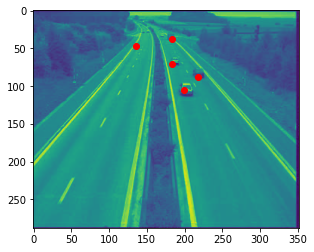

5

In [ ]:
ICV_Count_Objects('Original_Frame_133.jpg')

## Function to count the Number of objects in a given Frame

In [ ]:
def ICV_VIDEO_objects(video_path):
  count = 0
  # read the video
  cap = cv2.VideoCapture(video_path)
  # list to store the number of Objects in each Frame
  Number_Of_Objects = []
  while(cap.isOpened()):
      ret, frame = cap.read()

      if ret:
        # convert it into grayscale
          image = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
          # store th Frame
          path = str('Original_Frame_' + str(count) + '.jpg')
          cv2.imwrite(path,image)
          try :
            # Now, Count the Number Of objects using the above function
            total_objects_in_image = ICV_Count_Objects(path)
            # Append the Objects to a List which has Number of Objects in each Frame
            Number_Of_Objects.append(total_objects_in_image)
            # If it gives a error then 
          except IndexError:
            # Store the Number of Objects in Current Frame as Number of Objects in the Previous Frame
            total_objects_in_image = Number_Of_Objects[-1]
            Number_Of_Objects.append(total_objects_in_image)
          print('Number of Objects in the Frame {}'.format(total_objects_in_image))
        
        
        
          count=count+1
          if cv2.waitKey(1) & 0xFF == ord('q'):
              break
         
      else:
          break

  cap.release()
  cv2.destroyAllWindows()
  # return the the number of objects list which has no.of.objects in each Frame 
  return Number_Of_Objects

20 62.48199740725323


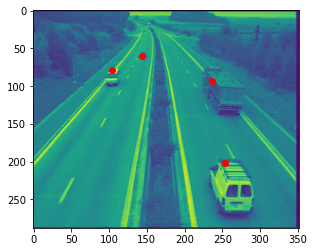

Number of Objects in the Frame 4
Number of Objects in the Frame 4
Number of Objects in the Frame 4
20 107.28000745712129


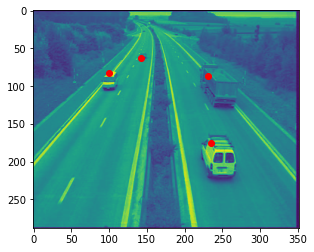

Number of Objects in the Frame 4
20 40.36087214122113


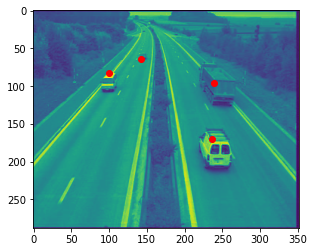

Number of Objects in the Frame 4
20 92.89241088485109


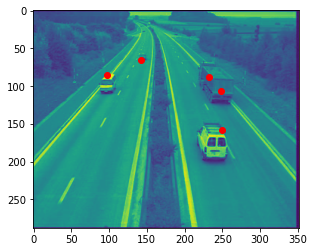

Number of Objects in the Frame 5
20 85.32877591996736


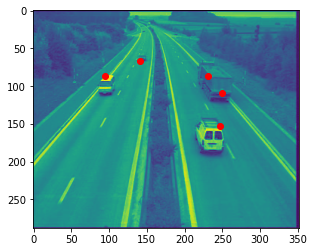

Number of Objects in the Frame 5
20 77.12976079309465


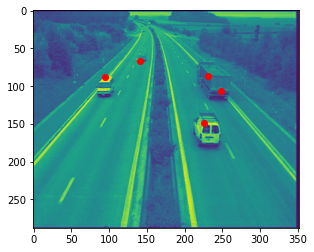

Number of Objects in the Frame 5
20 77.00649323271382


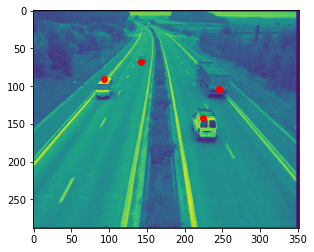

Number of Objects in the Frame 4
20 79.64923100695951


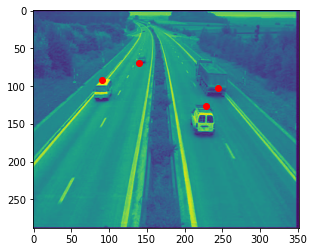

Number of Objects in the Frame 4
20 81.40024569987489


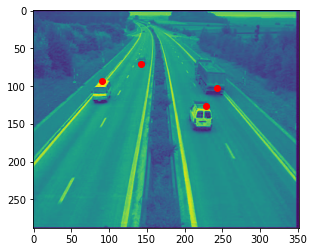

Number of Objects in the Frame 4
Number of Objects in the Frame 4
Number of Objects in the Frame 4
20 110.00454536063498


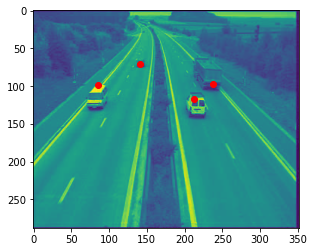

Number of Objects in the Frame 4
20 53.03772242470448


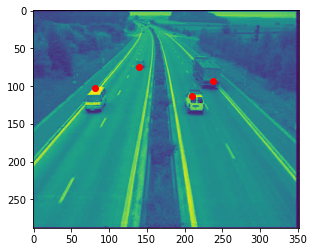

Number of Objects in the Frame 4
20 48.79549159502341


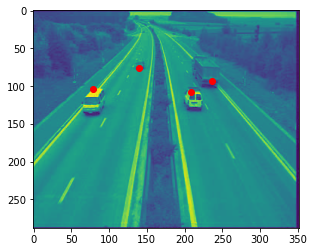

Number of Objects in the Frame 4
20 45.34313619501854


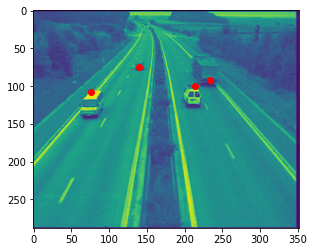

Number of Objects in the Frame 4
20 43.840620433565945


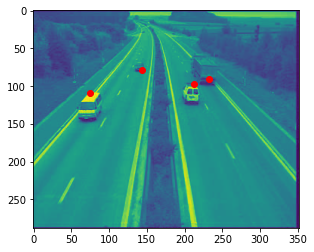

Number of Objects in the Frame 4
20 47.01063709417264


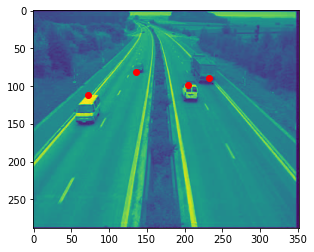

Number of Objects in the Frame 4
20 39.824615503479755


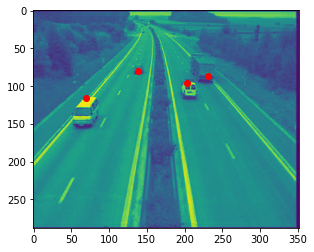

Number of Objects in the Frame 4
20 40.0


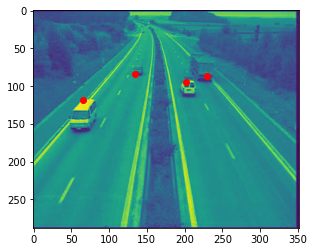

Number of Objects in the Frame 4
20 38.600518131237564


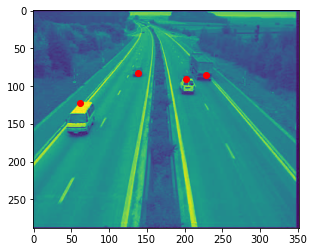

Number of Objects in the Frame 4
20 38.8329756778952


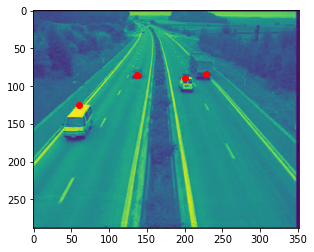

Number of Objects in the Frame 4
20 38.27531841800928


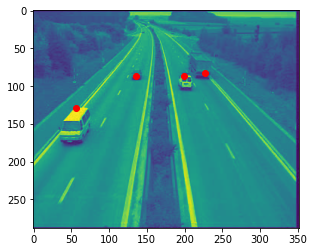

Number of Objects in the Frame 4
20 39.408120990476064


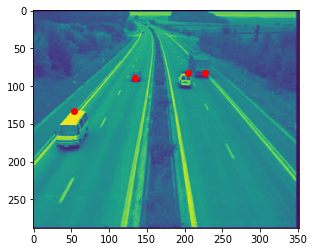

Number of Objects in the Frame 4
20 35.805027579936315


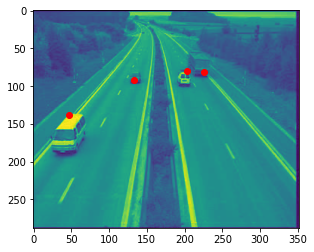

Number of Objects in the Frame 4
20 38.948684188300895


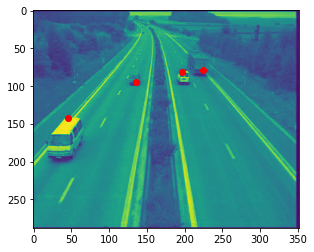

Number of Objects in the Frame 4
20 37.69615364994153


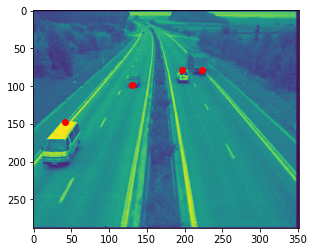

Number of Objects in the Frame 4
20 41.048751503547585


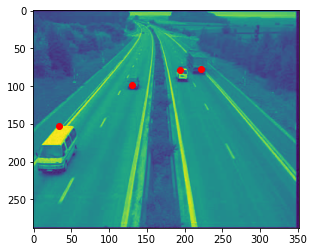

Number of Objects in the Frame 4
20 40.496913462633174


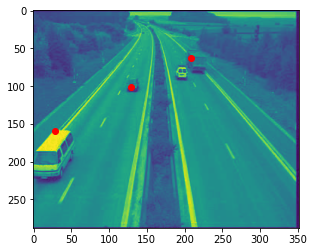

Number of Objects in the Frame 3
20 50.24937810560445


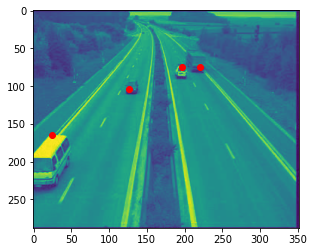

Number of Objects in the Frame 4
20 85.47514258543241


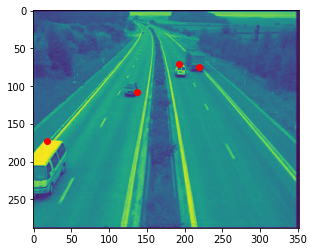

Number of Objects in the Frame 4
20 88.68483523128404


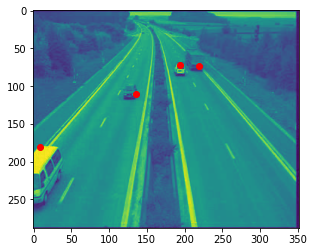

Number of Objects in the Frame 4
20 94.847245611035


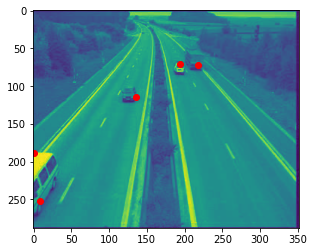

Number of Objects in the Frame 5
20 53.16013544000805


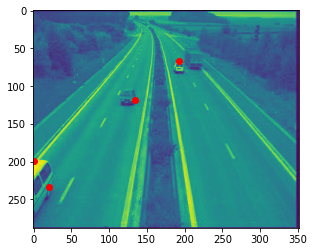

Number of Objects in the Frame 4
20 18.973665961010276


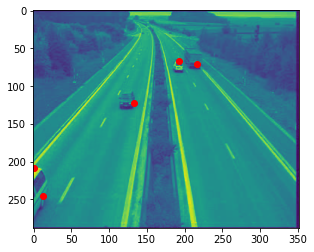

Number of Objects in the Frame 5
20 15.0


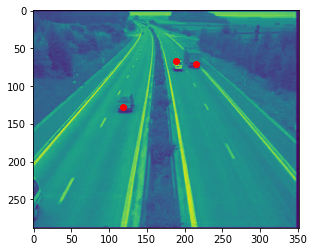

Number of Objects in the Frame 3
20 17.029386365926403


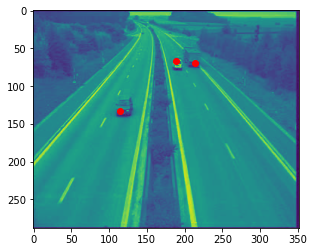

Number of Objects in the Frame 3
20 30.805843601498726


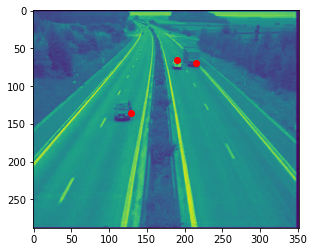

Number of Objects in the Frame 3
20 19.026297590440446


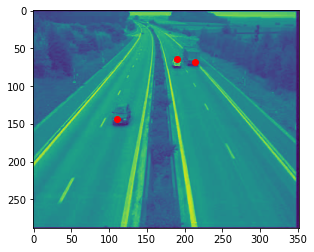

Number of Objects in the Frame 3
20 31.144823004794873


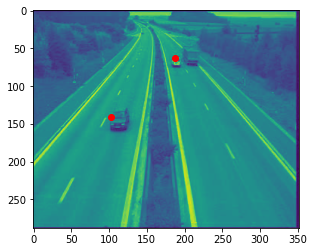

Number of Objects in the Frame 2
20 30.4138126514911


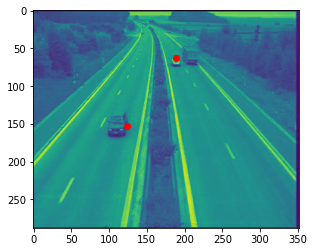

Number of Objects in the Frame 2
20 29.427877939124322


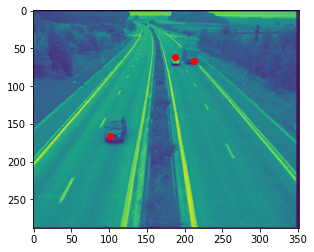

Number of Objects in the Frame 3
20 30.265491900843113


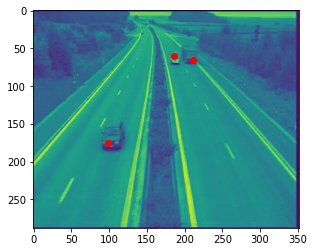

Number of Objects in the Frame 3
20 29.274562336608895


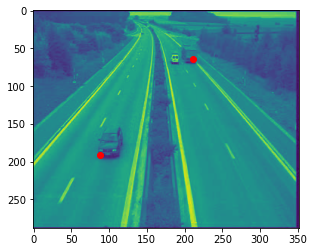

Number of Objects in the Frame 2
20 17.11724276862369


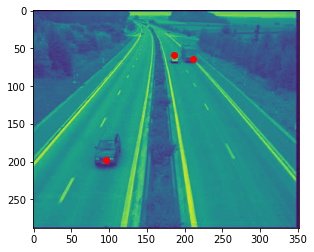

Number of Objects in the Frame 3
11.180339887498949 11.180339887498949


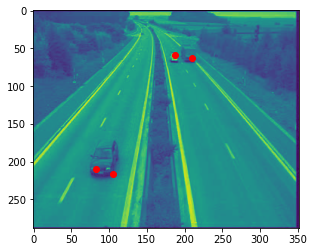

Number of Objects in the Frame 4
6.324555320336759 6.324555320336759


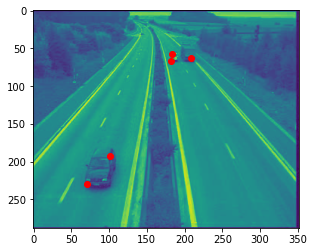

Number of Objects in the Frame 5
20 29.068883707497267


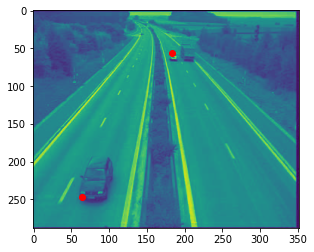

Number of Objects in the Frame 2
10.295630140987 10.295630140987


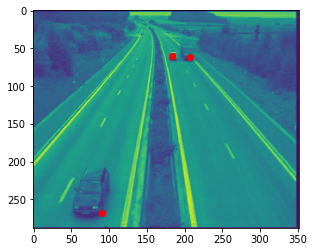

Number of Objects in the Frame 3
20 27.892651361962706


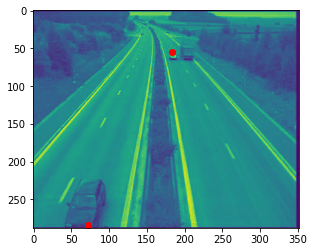

Number of Objects in the Frame 2
5.0990195135927845 5.0990195135927845


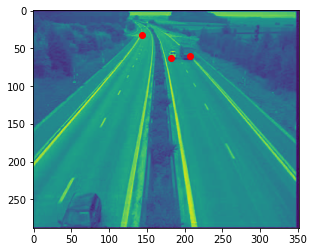

Number of Objects in the Frame 3
20 28.0178514522438


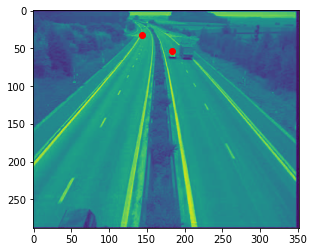

Number of Objects in the Frame 2
6.0 6.0


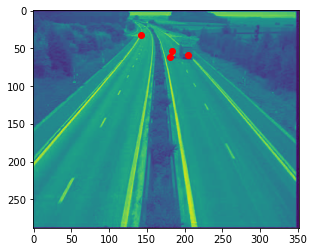

Number of Objects in the Frame 4
7.0710678118654755 7.0710678118654755


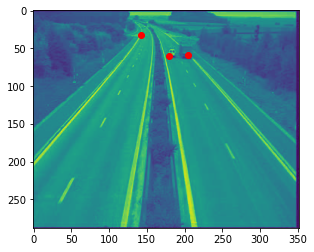

Number of Objects in the Frame 3
6.082762530298219 6.082762530298219


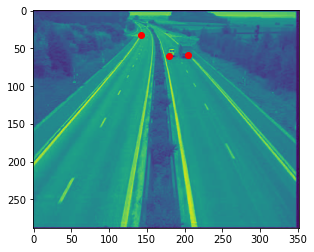

Number of Objects in the Frame 3
9.848857801796104 9.848857801796104


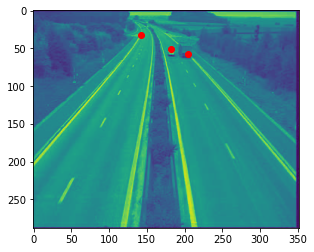

Number of Objects in the Frame 3
8.54400374531753 8.54400374531753


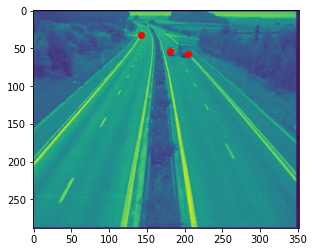

Number of Objects in the Frame 3
6.0 6.0


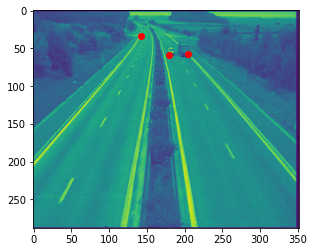

Number of Objects in the Frame 3
8.246211251235321 8.246211251235321


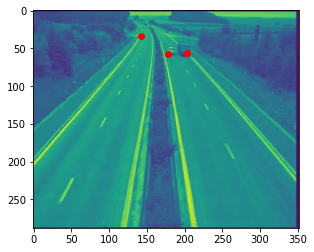

Number of Objects in the Frame 3
5.0 5.0


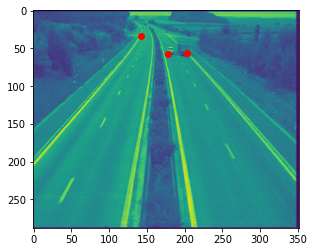

Number of Objects in the Frame 3
5.0 5.0


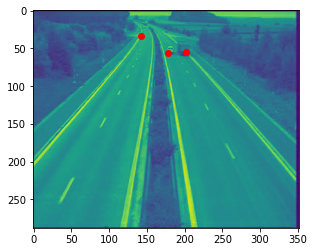

Number of Objects in the Frame 3
8.246211251235321 8.246211251235321


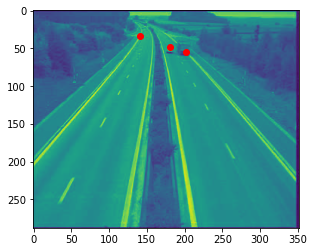

Number of Objects in the Frame 3
5.0990195135927845 5.0990195135927845


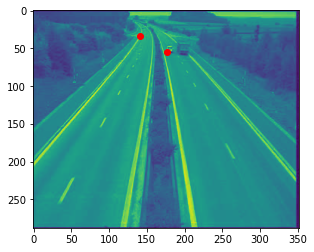

Number of Objects in the Frame 2
6.0 6.0


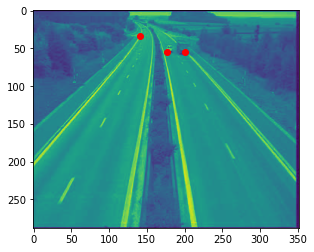

Number of Objects in the Frame 3
5.0 5.0


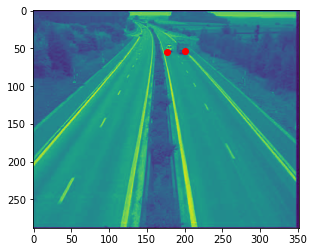

Number of Objects in the Frame 2
6.082762530298219 6.082762530298219


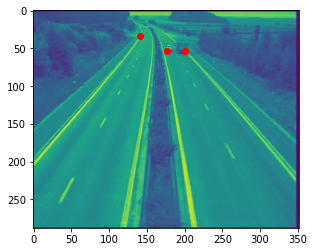

Number of Objects in the Frame 3
4.123 4.0


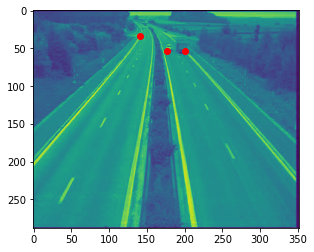

Number of Objects in the Frame 3
7.280109889280518 7.280109889280518


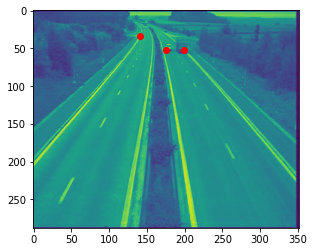

Number of Objects in the Frame 3
4.123 4.0


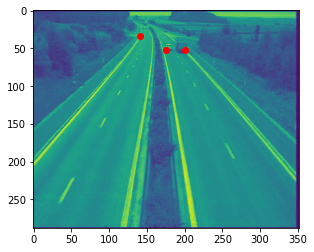

Number of Objects in the Frame 3
4.123 4.123105625617661


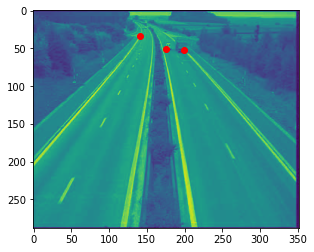

Number of Objects in the Frame 3
6.4031242374328485 6.4031242374328485


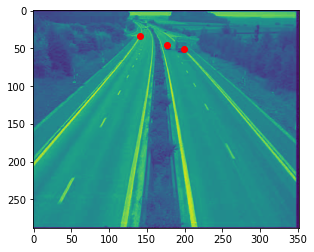

Number of Objects in the Frame 3
4.123 4.123105625617661


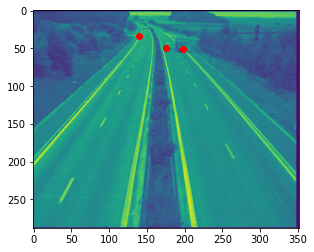

Number of Objects in the Frame 3
4.123 4.0


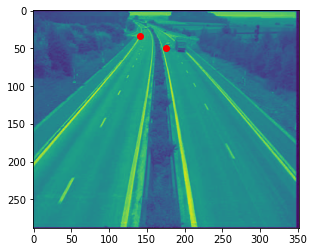

Number of Objects in the Frame 2
5.830951894845301 5.830951894845301


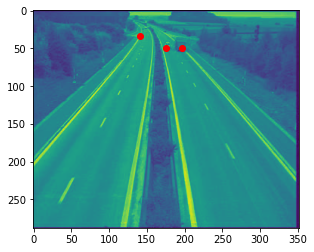

Number of Objects in the Frame 3
4.123 3.0


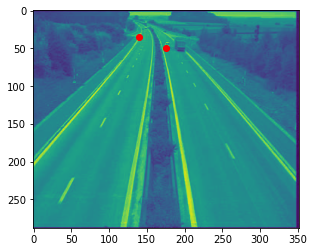

Number of Objects in the Frame 2
4.123 3.0


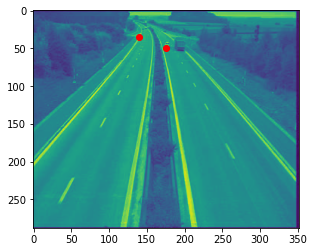

Number of Objects in the Frame 2
4.123 4.123105625617661


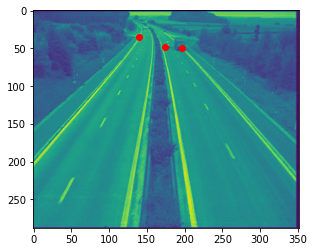

Number of Objects in the Frame 3
4.123 3.0


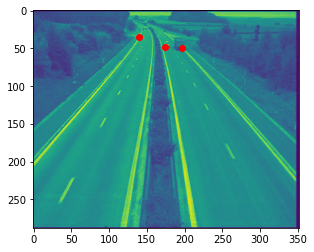

Number of Objects in the Frame 3
4.123 4.0


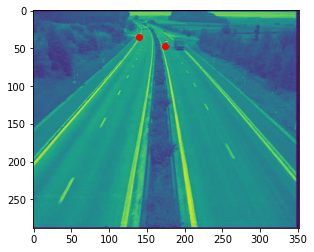

Number of Objects in the Frame 2
4.123 3.0


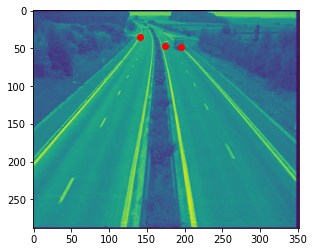

Number of Objects in the Frame 3
4.123 3.0


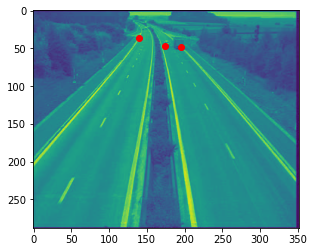

Number of Objects in the Frame 3
4.123 4.123105625617661


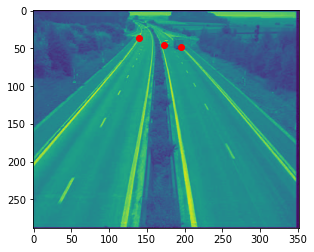

Number of Objects in the Frame 3
4.123 4.0


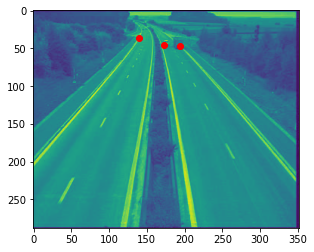

Number of Objects in the Frame 3
4.123 4.0


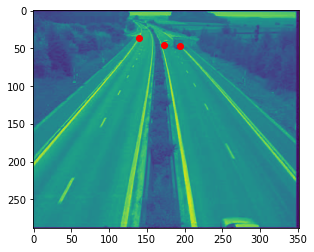

Number of Objects in the Frame 3
20 36.71511950137164


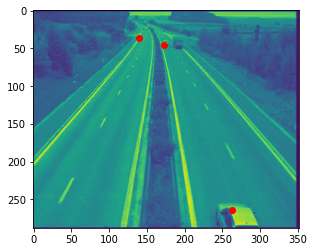

Number of Objects in the Frame 3
20 56.88585061331157


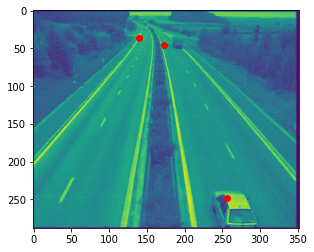

Number of Objects in the Frame 3
20 52.15361924162119


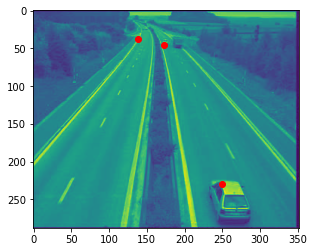

Number of Objects in the Frame 3
20 43.60045871318328


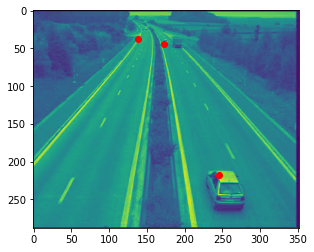

Number of Objects in the Frame 3
20 37.656340767525464


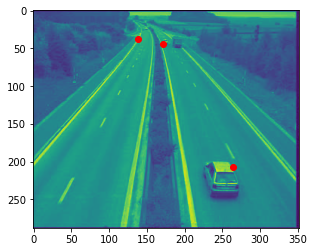

Number of Objects in the Frame 3
20 42.720018726587654


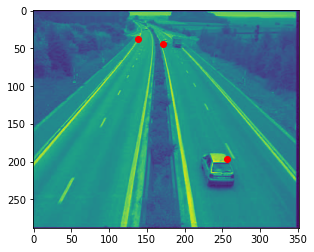

Number of Objects in the Frame 3
20 39.96248240537617


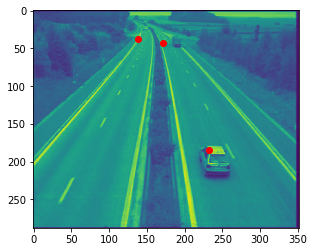

Number of Objects in the Frame 3
20 37.21558813185679


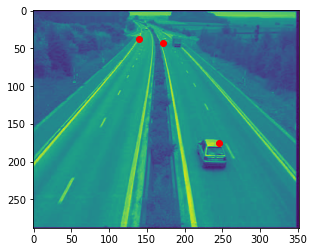

Number of Objects in the Frame 3
20 36.345563690772494


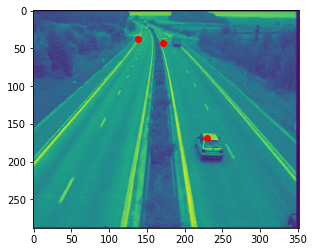

Number of Objects in the Frame 3
20 36.345563690772494


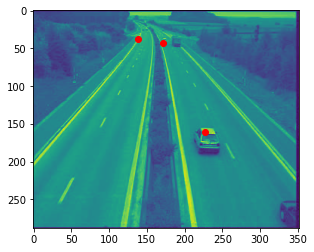

Number of Objects in the Frame 3
20 36.235341863986875


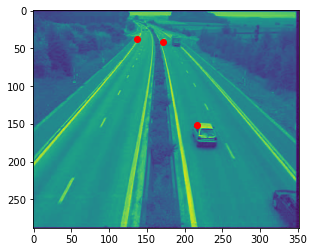

Number of Objects in the Frame 3
20 26.92582403567252


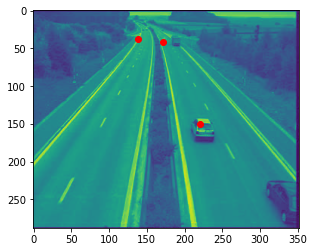

Number of Objects in the Frame 3
20 26.419689627245813


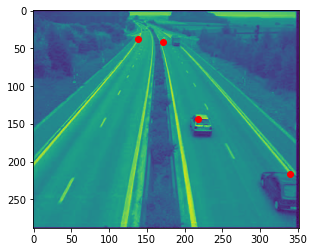

Number of Objects in the Frame 4
20 26.627053911388696


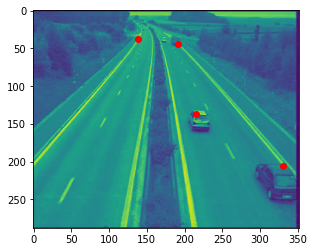

Number of Objects in the Frame 4
20 27.018512172212592


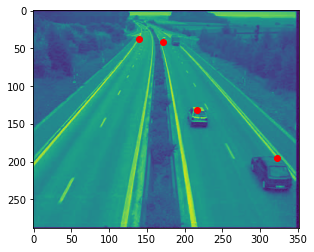

Number of Objects in the Frame 4
20 23.600847442411894


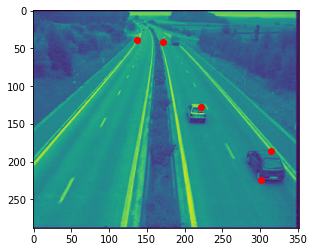

Number of Objects in the Frame 5
20 29.546573405388315


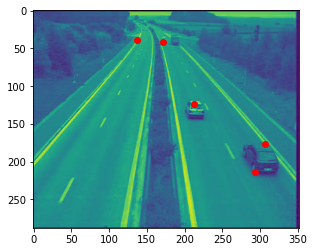

Number of Objects in the Frame 5
20 19.849433241279208


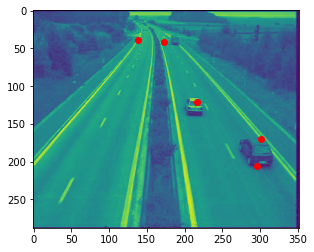

Number of Objects in the Frame 5
20 36.0


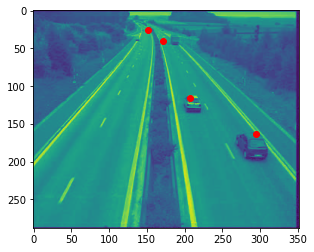

Number of Objects in the Frame 4
20 22.02271554554524


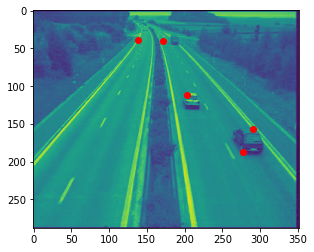

Number of Objects in the Frame 5
20 36.0


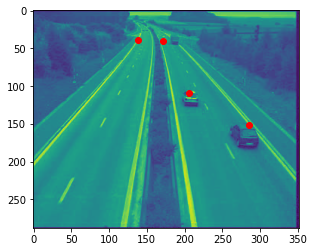

Number of Objects in the Frame 4
20 30.528675044947494


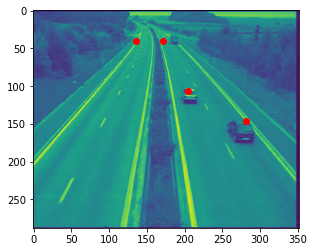

Number of Objects in the Frame 4
20 22.825424421026653


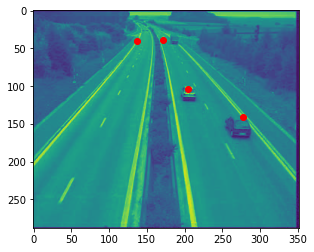

Number of Objects in the Frame 4
20 27.313000567495326


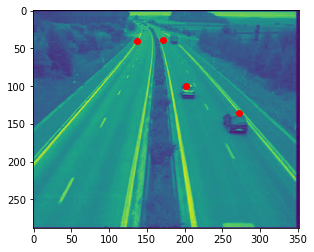

Number of Objects in the Frame 4
20 13.416407864998739


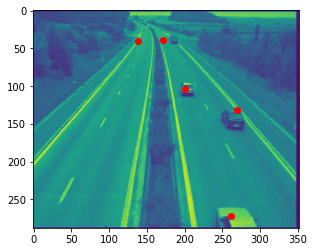

Number of Objects in the Frame 5
20 36.05551275463989


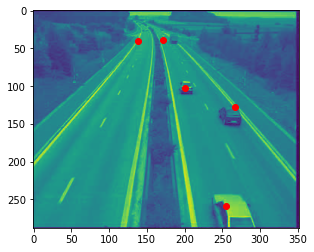

Number of Objects in the Frame 5
20 46.04345773288535


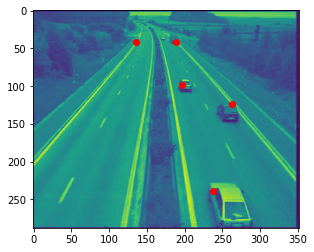

Number of Objects in the Frame 5
20 39.824615503479755


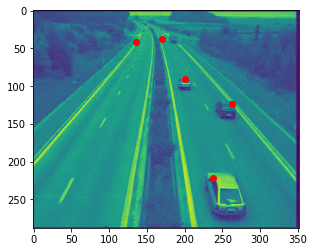

Number of Objects in the Frame 5
20 171.89822570346675


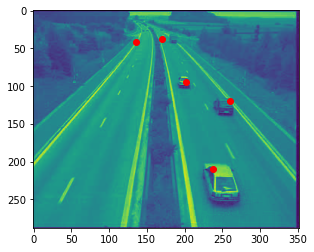

Number of Objects in the Frame 5
20 42.5440947723653


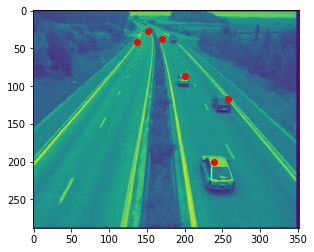

Number of Objects in the Frame 6
20 40.70626487409524


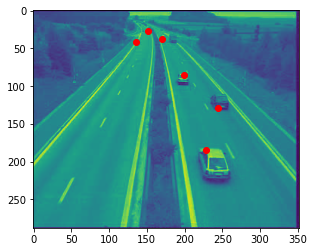

Number of Objects in the Frame 6
20 37.73592452822641


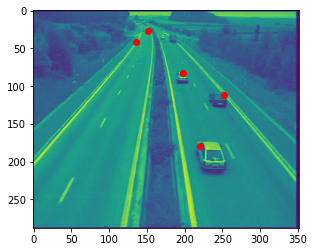

Number of Objects in the Frame 5
20 34.40930106817051


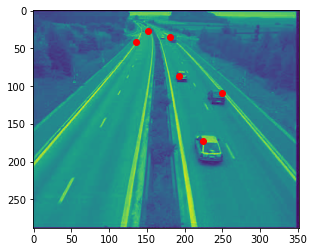

Number of Objects in the Frame 6
20 38.2099463490856


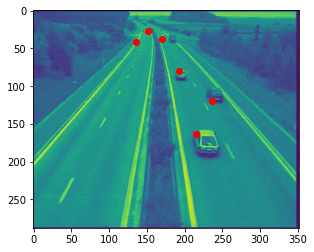

Number of Objects in the Frame 6
20 28.844410203711913


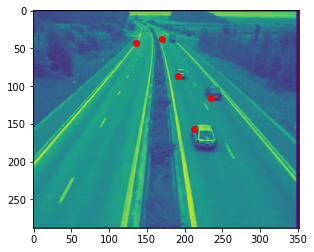

Number of Objects in the Frame 5
20 26.92582403567252


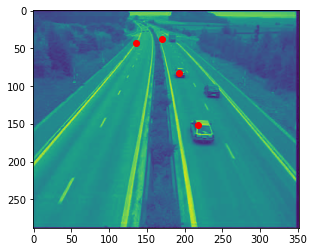

Number of Objects in the Frame 4
20 28.319604517012593


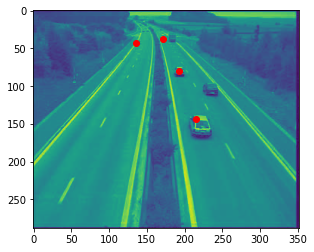

Number of Objects in the Frame 4
20 29.0


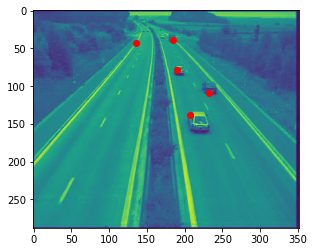

Number of Objects in the Frame 5
20 27.018512172212592


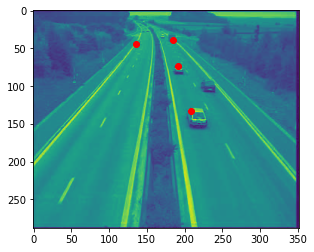

Number of Objects in the Frame 4
20 22.47220505424423


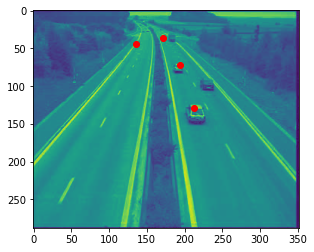

Number of Objects in the Frame 4
20 17.0


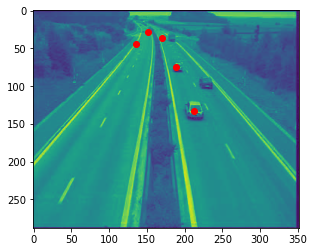

Number of Objects in the Frame 5
20 17.0


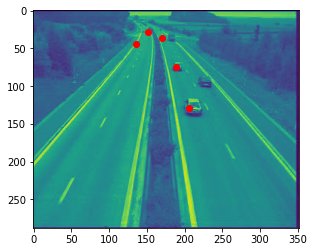

Number of Objects in the Frame 5
20 15.652475842498529


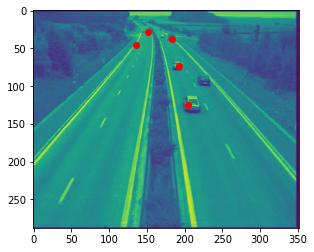

Number of Objects in the Frame 5
20 15.132745950421556


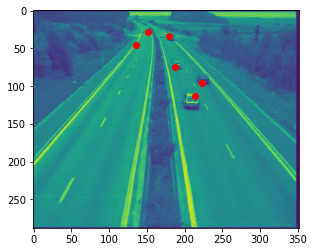

Number of Objects in the Frame 6
20 15.297058540778355


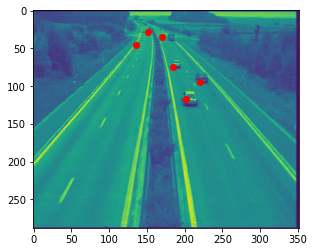

Number of Objects in the Frame 6
20 14.317821063276353


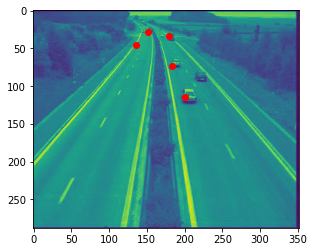

Number of Objects in the Frame 5
20 13.341664064126334


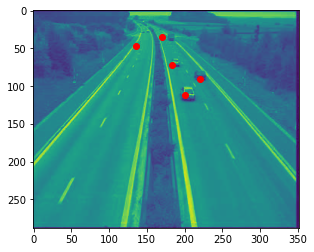

Number of Objects in the Frame 5
8.0 8.0


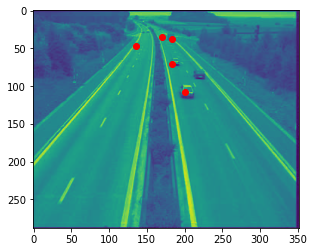

Number of Objects in the Frame 5
9.899494936611665 9.899494936611665


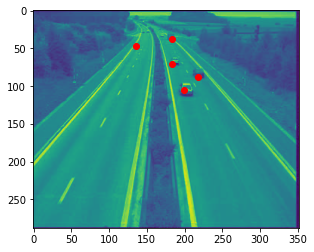

Number of Objects in the Frame 5
8.602325267042627 8.602325267042627


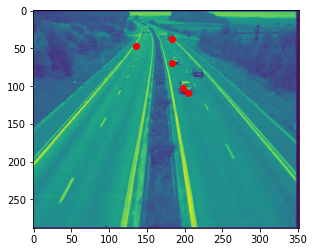

Number of Objects in the Frame 5
10.816653826391969 10.816653826391969


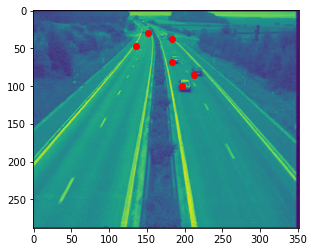

Number of Objects in the Frame 6
10.04987562112089 10.04987562112089


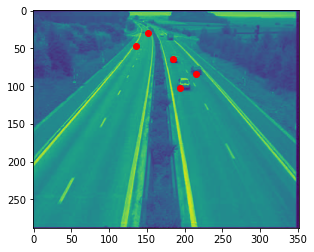

Number of Objects in the Frame 5
9.055385138137417 9.055385138137417


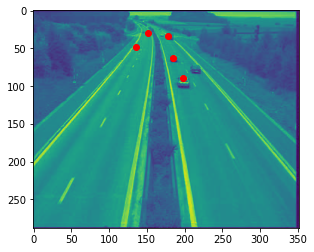

Number of Objects in the Frame 5
20 39.0


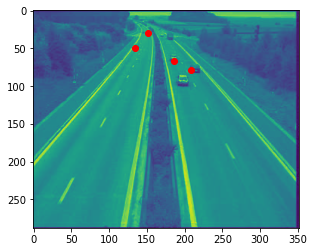

Number of Objects in the Frame 4
20 14.317821063276353


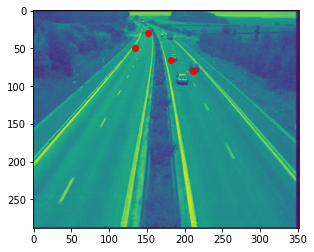

Number of Objects in the Frame 4


In [ ]:
Objects_per_frame = ICV_VIDEO_objects('DatasetC.mpg')

## BAR plot for Number of Objects in Video per each Frame

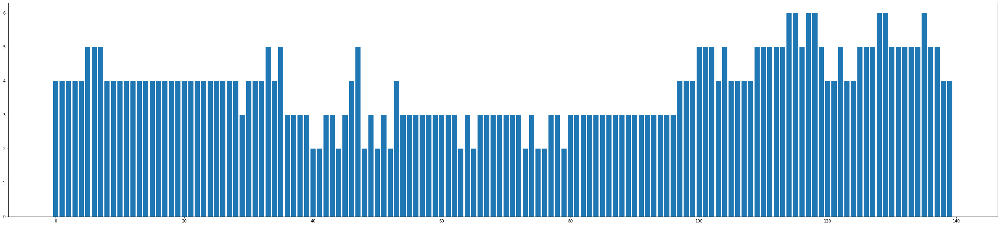

In [ ]:
range_values  = [i for i in range(140)]
plt.figure(figsize=(45,10))
plt.bar(range_values,Objects_per_frame)
path = 'BarPlot_video_count_of_objects'
plt.savefig(path)

## LINE Plot For Number of Obejcts in the video per each Frame

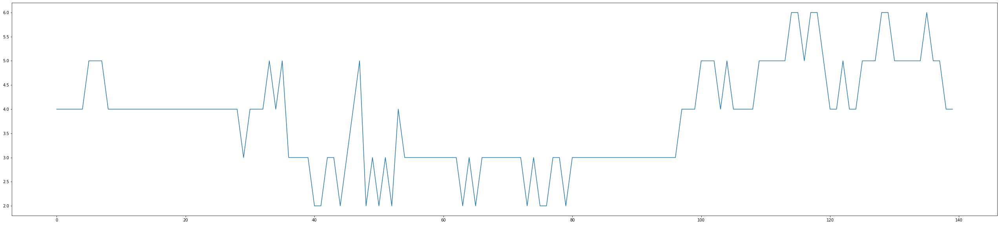

In [ ]:
plt.figure(figsize=(45,10))
plt.plot(range_values,Objects_per_frame)